In [1]:
import os 
import keras
import numpy as np 
import tensorflow as tf
from keras.preprocessing.image import ImageDataGenerator
import plotly.express as px
import matplotlib.pyplot as plt
from keras.models import Sequential, load_model
from keras.layers import GlobalAvgPool2D as GAP, Dense, Dropout
from keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.applications import ResNet50, ResNet50V2, InceptionV3, Xception, ResNet152, ResNet152V2

2023-03-16 11:05:00.864524: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


# DATA INFORMATION

In [2]:
# Class Names
root_path = '/Users/apurvsinghrathee/Downloads/Vegetable Images/train/'
class_names = sorted(os.listdir(root_path))
n_classes = len(class_names)

# Class Distribution
class_dis = [len(os.listdir(root_path + name)) for name in class_names if not name.startswith('.')]

# Show
print(f"Total Number of Classes : {n_classes} \nClass Names : {class_names}")

Total Number of Classes : 15 
Class Names : ['Bean', 'Bitter_Gourd', 'Bottle_Gourd', 'Brinjal', 'Broccoli', 'Cabbage', 'Capsicum', 'Carrot', 'Cauliflower', 'Cucumber', 'Papaya', 'Potato', 'Pumpkin', 'Radish', 'Tomato']


In [3]:
# Visualize 
fig = px.pie(names=class_names, values=class_dis, title="Class Distribution", hole=0.4)
fig.update_layout({'title':{'x':0.5}})
fig.show()

 all the classes are equally distributed.

# Data Loading

In [4]:
# Initialize Generator
train_gen = ImageDataGenerator(rescale=1/255., rotation_range=10)
valid_gen = ImageDataGenerator(rescale=1/255.)
test_gen = ImageDataGenerator(rescale=1/255.)

# Load Data
train_ds = train_gen.flow_from_directory(root_path, class_mode='binary', target_size=(256,256), shuffle=True, batch_size=32)
valid_ds = valid_gen.flow_from_directory(root_path.replace('train','validation'), class_mode='binary', target_size=(256,256), shuffle=True, batch_size=32)
test_ds = test_gen.flow_from_directory(root_path.replace('train', 'test'), class_mode='binary', target_size=(256,256), shuffle=True, batch_size=32)

Found 15000 images belonging to 15 classes.
Found 3000 images belonging to 15 classes.
Found 3000 images belonging to 15 classes.


# Data Visualisation

In [5]:
def show_images(GRID=[5,5], model=None, size=(20,20), data=train_ds):
    n_rows = GRID[0]
    n_cols = GRID[1]
    n_images = n_cols * n_rows
    
    i = 1
    plt.figure(figsize=size)
    for images, labels in data:
        id = np.random.randint(32)
        image, label = images[id], class_names[int(labels[id])]
        
        plt.subplot(n_rows, n_cols, i)
        plt.imshow(image)
        
        if model is None:
            title = f"Class : {label}"
        else:
            pred = class_names[int(np.argmax(model.predict(image[np.newaxis, ...])))]
            title = f"Org : {label}, Pred : {pred}"
        
        plt.title(title)
        plt.axis('off')
        
        i+=1
        if i>=(n_images+1):
            break
            
    plt.tight_layout()
    plt.show()

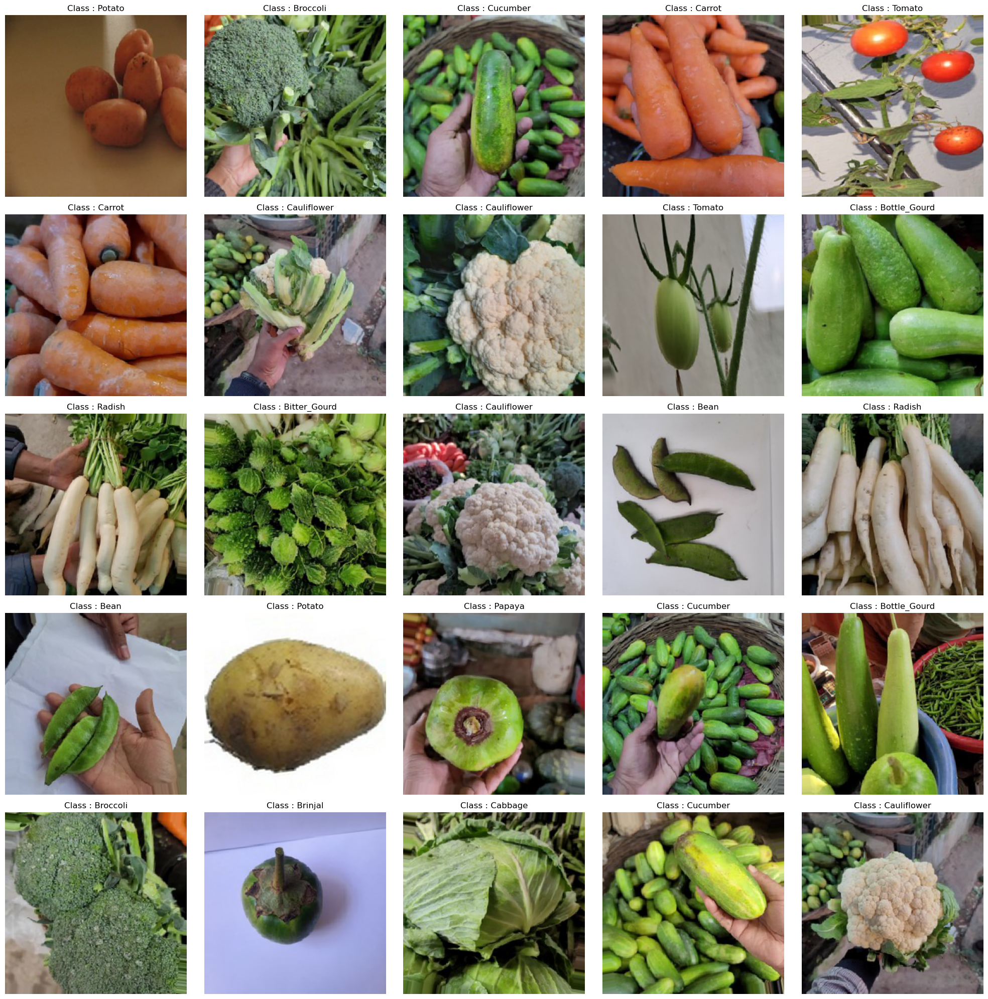

In [6]:
show_images()

# DATA AUGMENTATION

In [10]:
import cv2
import matplotlib.pyplot as plt

In [66]:
def grayscale_resize(img):
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    img_resized = cv2.resize(img_gray, (64, 64))
    return img_resized[..., np.newaxis]

In [67]:
# Initialize Generator
train_gen = ImageDataGenerator(rescale=1/255., preprocessing_function=grayscale_resize, rotation_range=10)
valid_gen = ImageDataGenerator(rescale=1/255., preprocessing_function=grayscale_resize)
test_gen = ImageDataGenerator(rescale=1/255., preprocessing_function=grayscale_resize)

In [68]:
# Load Data
train_ds = train_gen.flow_from_directory(root_path, class_mode='binary', target_size=(64,64), shuffle=True, batch_size=32)
valid_ds = valid_gen.flow_from_directory(root_path.replace('train','validation'), class_mode='binary', target_size=(64,64), shuffle=True, batch_size=32)
test_ds = test_gen.flow_from_directory(root_path.replace('train', 'test'), class_mode='binary', target_size=(64,64), shuffle=True, batch_size=32)

Found 15000 images belonging to 15 classes.
Found 3000 images belonging to 15 classes.
Found 3000 images belonging to 15 classes.


In [69]:
def show_images(GRID=[5, 5], size=(10,10), data=None, grayscale=False):
    if data is None:
        return
    
    x, y = data.next()
    fig, axes = plt.subplots(GRID[0], GRID[1], figsize=size)
    for i, ax in enumerate(axes.flat):
        if grayscale:
            img = x[i].squeeze()
            ax.imshow(img, cmap='gray')
        else:
            ax.imshow(x[i])
        ax.axis('off')
    plt.show()

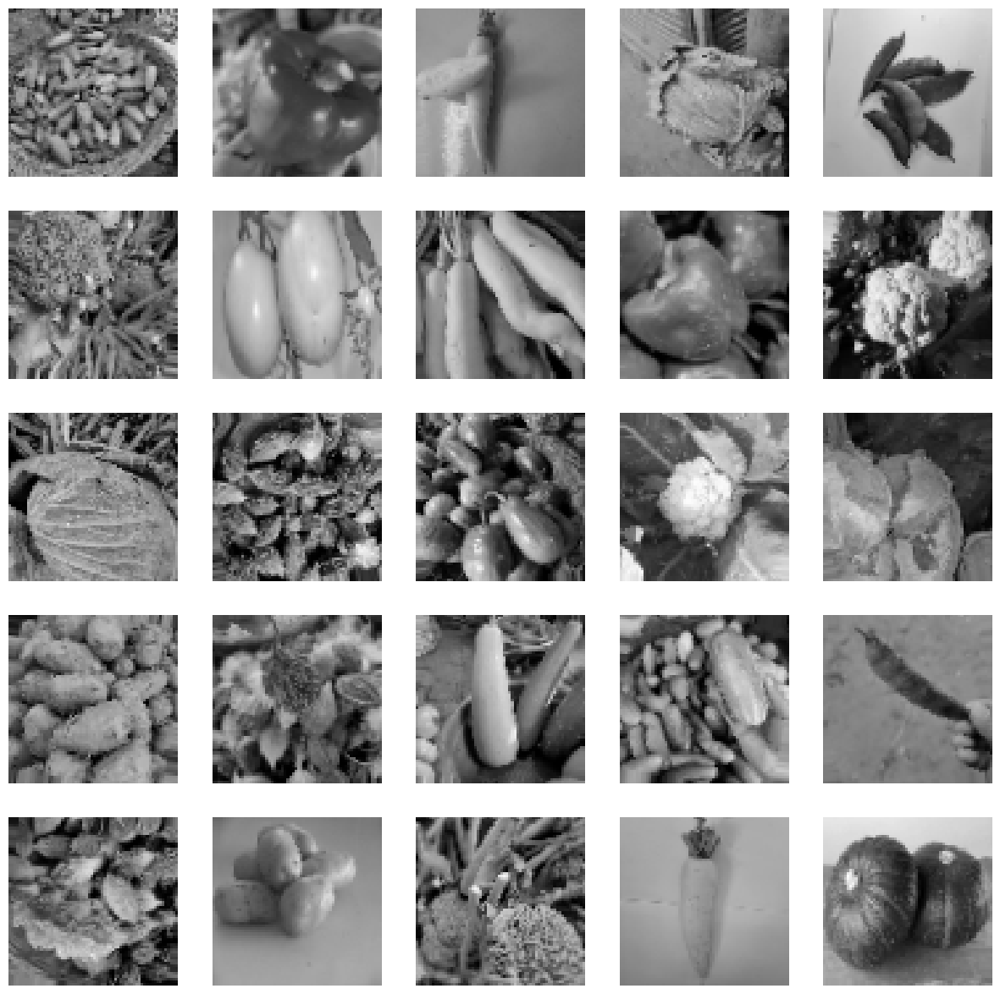

In [72]:
show_images(GRID=[5, 5], size=(15,15), data=train_ds, grayscale=True)